# RoadBuddy Demo

*Find a friend for the long road*

**By:** Alon Bar, Gal Yona, Leshem Choshem & Tomer Levi

In [1]:
import sys
import clustering
import gmaps2
import time
import pandas as pd
from sklearn.cluster import KMeans

def to_pointE7(df, fields):
    return (df[fields]/pow(10,7)).T.apply(lambda x: tuple(x.values)).tolist()

def to_point(df, fields):
    return (df[fields]/pow(10,7)).T.apply(lambda x: tuple(x.values)).tolist()

C:\Users\user\Anaconda3\lib\site-packages\sklearn\utils\fixes.py:64: DeprecationWarning: inspect.getargspec() is deprecated, use inspect.signature() instead
  if 'order' in inspect.getargspec(np.copy)[0]:


## Defining User Routine

In [4]:
df = clustering.create(r"gal_hist.json")
#df = df[df["timestampMs"].apply(float) > (time.time()*1000 - 250*24*60*60*1000)]
df.head()

,accuracy,activitys,altitude,heading,latitudeE7,longitudeE7,timestampMs,velocity,weekly_miliseconds
0,1178,NaN,NaN,NaN,317661844,352188428,1448472102611,NaN,3.352860e+12
1,1148,"[{u'activities': [{u'confidence': 92, u'type':...",NaN,NaN,317663458,352180849,1448471777056,NaN,3.352560e+12
2,1148,"[{u'activities': [{u'confidence': 62, u'type':...",NaN,NaN,317663458,352180849,1448471564058,NaN,3.352320e+12
3,1148,NaN,NaN,NaN,317663458,352180849,1448471441128,NaN,3.352200e+12
4,1148,"[{u'activities': [{u'confidence': 100, u'type'...",NaN,NaN,317663458,352180849,1448471311066,NaN,3.352080e+12



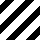
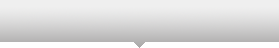
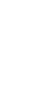
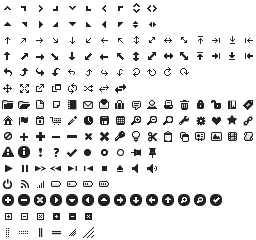
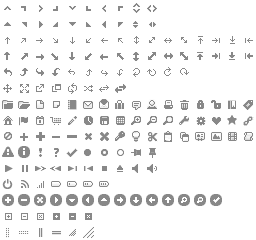
...
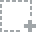
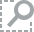
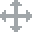
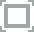
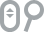

In [5]:
gmaps2.drawMap("Raw", {
        "red" : to_pointE7(df, ["latitudeE7", "longitudeE7"]),
    })

In [6]:
cleaned = clustering.clean(df,20, 0)

In [7]:
print("In the last 250 days:")
print("Number of points before cleaning:", len(df)) 
print("Number of points after cleaning:", len(cleaned))

In the last 250 days:
('Number of points before cleaning:', 77911)
('Number of points after cleaning:', 112)



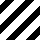
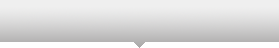
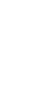
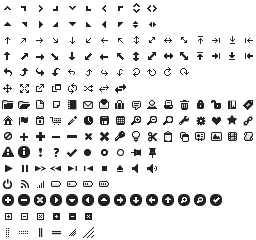
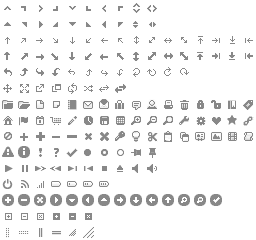
...
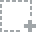
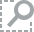
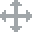
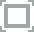
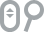

In [6]:
gmaps2.drawMap("Cleaned", {
        "orange" : to_pointE7(cleaned, ["latitudeE7", "longitudeE7"])
    }, alpha=0.8)

In [7]:
clustered = clustering.cluster(cleaned, KMeans(5))


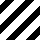
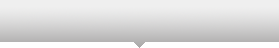
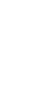
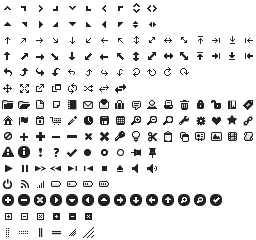
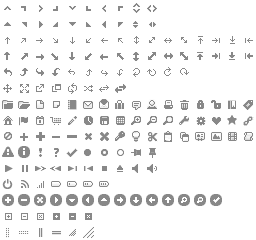
...
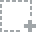
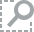
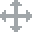
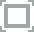
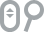

In [8]:
gmaps2.drawMap("Clustered", {
        "orange" : to_pointE7(cleaned, ["latitudeE7", "longitudeE7"]),
        "green" : to_pointE7(clustered, ["center_lat", "center_long"])
    })

## Finding Shared Routes

In [9]:
import json
users = json.load(open(r"test2.json"))


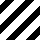
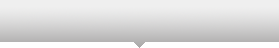
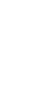
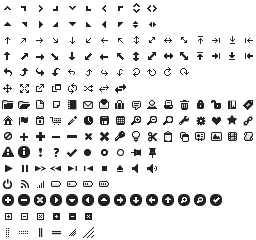
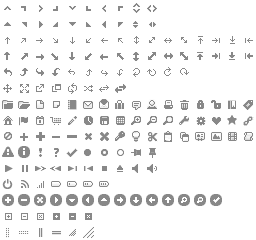
...
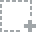
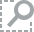
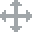
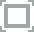
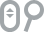

In [10]:
alon_df = pd.DataFrame(users["alon"])
dana_df = pd.DataFrame(users["dana"])
gmaps2.drawMap("Two Cluster Groups", {
        "purple" : to_point(alon_df, ["latitude", "longitude"]),
        "brown" : to_point(dana_df, ["latitude", "longitude"]),
    }, 8, 0.5)

In [11]:
import Grid
user = "alon"
dx = 100000
dy = 100000
alphaDistance = 0.0000001
alphaTime = 0.00001
companions = Grid.getCompanions(users, user, dx, dy, alphaDistance, alphaTime)

45 30 1009
---------------
---------------
---------------
{(320728374, 347931619, 317784440, 352113580): [{'maxEndCoordination': (317796669, 352108845), 'maxStartLocation': 0.21795791851993615, 'maxEndLocation': 0.14320179791236293, 'candidateDistance': 0.14320179791236293, 'maxStartCoordination': (320710544, 347941211), 'companion': 'dana'}], (317794440, 352103580, 317955785, 352424009): [{'maxEndCoordination': (317935578, 352414009), 'maxStartLocation': 0.291179676322922, 'maxEndLocation': 0.24383528083988248, 'candidateDistance': 0.24383528083988248, 'maxStartCoordination': (317816669, 352119845), 'companion': 'dana'}]}
------



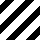
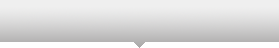
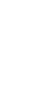
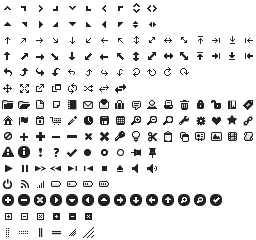
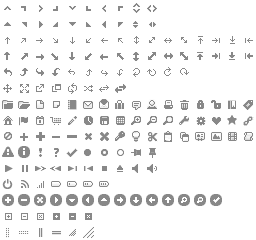
...
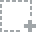
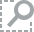
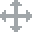
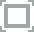
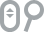

In [12]:
for start_lat, start_lon, end_lat, end_lon in companions:
    routes = companions[(start_lat, start_lon, end_lat, end_lon)]
    for route in routes:
        pass
    pass

gmaps2.drawMap("Two Cluster Groups", {
        #"purple" : to_point(alon_df, ["latitude", "longitude"]),# - set([(31.779444000000002, 35.210357999999999),(31.795578500000001, 35.2424009)]),
        #"brown" : to_point(dana_df, ["latitude", "longitude"]),
        "red" : [(start_lat/pow(10,7), start_lon/pow(10,7)), (end_lat/pow(10,7), end_lon/pow(10,7))],
        "green" : [(route["maxStartCoordination"][0]/pow(10,7), route["maxStartCoordination"][1]/pow(10,7)),
                  (route["maxEndCoordination"][0]/pow(10,7), route["maxEndCoordination"][1]/pow(10,7))]
}, 8, 0.5)